In [1]:
import torch.utils.data as tdata
import torch
import numpy as np
from pathlib import Path

In [2]:
class Dataset0D(tdata.Dataset):
    
    def __init__(self, input_file, output_file):
        self.input = np.load(input_file)
        self.output= np.load(output_file)
        
    def __len__(self):
        return len(self.input)
    
    def __getitem__(self, idx):
        return torch.from_numpy(self.input[idx]).float(), torch.from_numpy(self.output[idx]).float()


In [27]:
dir = Path('../data/healthy/0080_0001/jc_solver_dir_0/artificial_stenosis/Manual_1')
#dir = Path('../data/healthy/0080_0001/jc_solver_dir_0/artificial_stenosis/Manual_1')

#sim_dataset = Dataset0D(dir / 'training_data_old' / 'input.npy', dir / 'training_data_old' / 'output.npy')
sim_dataset = Dataset0D(dir / 'data'/ 'val_data' / 'input.npy', dir / 'data' / 'val_data' / 'output.npy')

In [4]:
inp, out = sim_dataset[0]

In [5]:
import matplotlib.pyplot as plt

# Check Uniformity of Input

(array([631., 629., 631., 630., 630., 631., 629., 631., 630., 630., 630.,
        630., 630., 631., 629., 630., 630., 631., 630., 630., 630., 630.,
        630., 630., 631., 630.]),
 array([0.95006195, 1.01282763, 1.07559332, 1.138359  , 1.20112469,
        1.26389038, 1.32665606, 1.38942175, 1.45218743, 1.51495312,
        1.57771881, 1.64048449, 1.70325018, 1.76601586, 1.82878155,
        1.89154724, 1.95431292, 2.01707861, 2.07984429, 2.14260998,
        2.20537567, 2.26814135, 2.33090704, 2.39367272, 2.45643841,
        2.5192041 , 2.58196978]),
 <BarContainer object of 26 artists>)

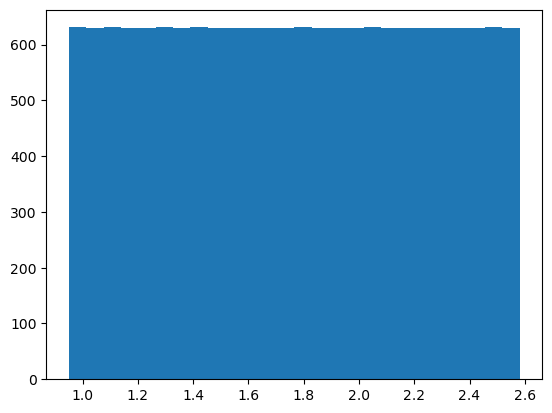

In [17]:
# uniform
plt.hist(sim_dataset.input[:, 3], bins = 'auto')

# Check Distributions of individual Pressures and FLows

In [7]:
from scipy.stats import norm
import scipy.stats as stats

In [8]:
def sep_QF(out):
    ''' for a single sample, seperates pressures,flows'''
    return out[::2], out[1::2]


In [9]:
from ipywidgets import interact, fixed

In [10]:

def plot_point_data(point, dataset):
    vess = point
    point*=2
    pressures = sim_dataset.output[:, point]
    flows = sim_dataset.output[:, point+1]
    
    
    fig, ax = plt.subplots(2, 2, figsize=(10,10))
    ax = ax.flatten()
    stats.probplot(pressures, dist = 'norm',plot = ax[0])
    
    ax[1].hist(pressures, bins = 'auto', density=True)
    x_min, x_max = ax[1].get_xlim()
    x = np.linspace(x_min, x_max, 100)
    mean, std = norm.fit(pressures)
    ax[1].plot(x, norm.pdf(x, mean, std ))
    ax[1].set_title('Pressures')
    
    stats.probplot(flows, dist = 'norm',plot = ax[2])
    
    ax[3].hist(flows, bins = 'auto', density=True)
    x_min, x_max = ax[3].get_xlim()
    x = np.linspace(x_min, x_max, 100)
    mean, std = norm.fit(flows)
    ax[3].plot(x, norm.pdf(x, mean, std ))
    ax[3].set_title("Flows")
    fig.suptitle(f'Distributions for vessel {vess}')
    


In [26]:
for i in range(len(sim_dataset)):
    if (sim_dataset[i][0] < 1.0).any():
        print(sim_dataset[i][0])
        break

In [28]:
interact(plot_point_data, point = (0, 20), dataset=fixed(sim_dataset))

interactive(children=(IntSlider(value=10, description='point', max=20), Output()), _dom_classes=('widget-inter…

<function __main__.plot_point_data(point, dataset)>

In [12]:
from ipywidgets import interact, fixed

In [13]:
def plot_linear(point, dataset):
    plt.scatter(dataset.input[:,point], dataset.output[:,point])

In [14]:
interact(plot_linear, point = (0, 23), dataset=fixed(sim_dataset))

interactive(children=(IntSlider(value=11, description='point', max=23), Output()), _dom_classes=('widget-inter…

<function __main__.plot_linear(point, dataset)>

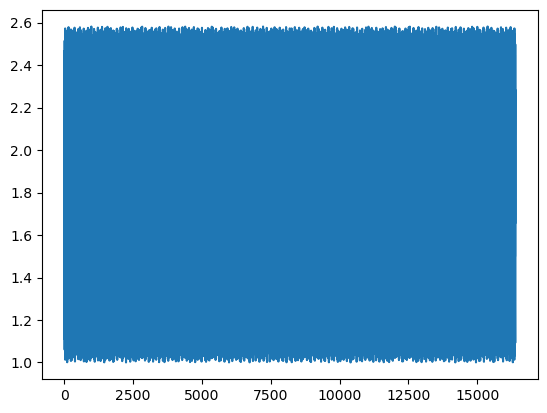

In [20]:
plt.plot(range(len(sim_dataset.input[:, 0]) ), sim_dataset.input[:, 3])

In [32]:
output = sim_dataset.output

In [34]:
output[:,0] = (output[:,0] - output[:, 0].mean()) / output[:, 0].std()

In [35]:
output

array([[-5.67955649e-01,  3.06808917e+01,  1.28265813e+04, ...,
         1.22762519e+00,  1.17011370e+04,  1.38549904e+00],
       [ 4.46257061e-01,  3.22753583e+01,  1.39230164e+04, ...,
         1.48807645e+00,  1.44162892e+04,  2.11895025e+00],
       [ 3.40073500e-01,  2.90715257e+01,  1.24981103e+04, ...,
         1.22968290e+00,  1.01242250e+04,  9.59082841e-01],
       ...,
       [-8.62399045e-01,  2.87447712e+01,  1.29471677e+04, ...,
         1.16417797e+00,  1.27196582e+04,  1.66074228e+00],
       [-4.79952805e-01,  2.64830800e+01,  1.19931866e+04, ...,
         1.18199324e+00,  1.24367657e+04,  1.58426260e+00],
       [ 2.00913218e+00,  2.82347258e+01,  1.50644731e+04, ...,
         1.16805308e+00,  1.41746363e+04,  2.05365911e+00]])

#

# Model Testing

In [1]:
import sys
sys.path.append('..')
from scripts.ml_scripts.nn_model import *

from pathlib import Path
import torch
from torch import nn
import pytorch_lightning as pl
import numpy as np
import os
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping

In [2]:
# data
dir = Path('../data/healthy/0080_0001/jc_solver_dir_0/artificial_stenosis/Manual_0')
sim_dataset = Dataset0D(dir / 'training_data' / 'input.npy', dir / 'training_data' / 'output.npy', normalization)

In [3]:
# load through torch
test_loader = torch.load(dir / "training_data" / "test_dataloader.pt")

In [4]:
test_loader.dataset[0]

(tensor([1.4226, 1.2020, 1.5326, 2.2344, 1.4262, 1.4870, 1.0154, 2.4525, 1.3524,
         1.8639, 2.1107, 2.3453, 1.8304, 1.2399, 1.0687, 1.0870, 1.0734, 1.4688,
         1.2784, 2.2390, 1.3936, 2.0272, 1.4163, 1.5118]),
 tensor([ 0.1128, -1.0429, -0.9610, -1.0430, -1.0167, -1.0430, -1.0129, -1.1877,
         -1.0167, -1.0167, -1.0167, -1.0167, -1.0168, -1.0168,  0.5293,  0.5296,
         -0.4319, -0.4315,  0.6211,  0.6234, -0.4394, -0.4394,  1.1822,  1.1818,
          0.0184, -1.6455, -0.2632, -1.6455, -1.6455, -1.6455, -1.3983, -1.3983,
         -2.0830, -2.0830, -0.7683, -0.7682, -1.2984, -1.2984, -0.6828, -0.5105,
         -0.7744, -0.5105, -0.5105, -0.5105, -0.9367, -0.9367, -0.1202, -0.1200]))

In [5]:
class PredictConfig(LightningNN):
    
    def __init__(self, revert_map, model) -> None:
        super().__init__(model, lr = 0)
        self.revert_map = revert_map
        
    
    def predict_step(self, batch, batch_idx, dataloader_idx=0):
        x, y = batch
        y_hat = self.model(x)
        revert(y_hat, self.revert_map)
        revert(y, self.revert_map)
        
        return torch.stack((y, y_hat), dim = 1)

In [6]:
input_data, output_data = sim_dataset[0]
nnmodel = BasicNN(input_neurons=len(input_data), output_neurons=len(output_data), hidden_layers=3, neurons_per_layer=1000)
litmodel = PredictConfig(sim_dataset.revert_map, nnmodel)

In [15]:
all_results_folder = dir / 'training_results'
if not os.path.exists(all_results_folder):
    os.mkdir(all_results_folder)

cur_results_folder = all_results_folder / 'test1'
if not os.path.exists(cur_results_folder):
    os.mkdir(cur_results_folder)

In [20]:
logger = pl.loggers.CSVLogger(cur_results_folder)

In [21]:
trainer = pl.Trainer( max_epochs=100, accelerator="gpu", default_root_dir=cur_results_folder, logger = logger , log_every_n_steps=5)#, fast_dev_run=True)
rez = trainer.predict(model=litmodel, dataloaders=test_loader, ckpt_path= dir / "training_results" / "run1" / "lightning_logs" / "version_0" / "checkpoints" / "epoch=99-step=10300.ckpt", return_predictions=True)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Restoring states from the checkpoint path at ..\data\healthy\0080_0001\jc_solver_dir_0\artificial_stenosis\Manual_0\training_results\run1\lightning_logs\version_0\checkpoints\epoch=99-step=10300.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from checkpoint at ..\data\healthy\0080_0001\jc_solver_dir_0\artificial_stenosis\Manual_0\training_results\run1\lightning_logs\version_0\checkpoints\epoch=99-step=10300.ckpt


Predicting: 0it [00:00, ?it/s]

In [22]:
logger.version

1

In [56]:
import matplotlib.pyplot as plt
from ipywidgets import interact, fixed

In [50]:
def d2m(val):
    return val / 1333.22

In [47]:
# retrieve x
x = []
for i in range(len(test_loader.dataset)):
    x.append(test_loader.dataset[i][0])
x = torch.vstack(x)

In [48]:
# retrieve y, y_hat
rez = torch.vstack(rez)

In [49]:
# get residuals
residuals = rez[:, 1]rez[:, 0] - 

In [72]:
def plot_residuals(x, residuals, vessel, save = False, save_dir: Path = None):

    P_vessel = vessel * 2
    Q_vessel = vessel * 2 + 1
    
    fig, ax = plt.subplots(1, 2, figsize = (20, 10))
    ax[0].set_title('Residual Pressures (mmHg)')
    ax[0].set_xlabel('radius change')
    ax[0].set_ylabel('residual (mmHg)')
    ax[0].scatter(x[:, vessel], d2m(residuals[:, P_vessel]))
    
    ax[1].set_title('Residual Flows (ml/s)')
    ax[1].set_xlabel('radius change')
    ax[1].set_ylabel('residual (ml/s)')
    ax[1].scatter(x[:, vessel],residuals[:, Q_vessel])
    
    if save:
        fig.savefig(save_dir / f"vessel_{vessel}_residuals.png")
        plt.close(fig)
    else:
        fig.show()



In [73]:
imagedir = dir / "training_results" / "images"

C:\Users\johnd\AppData\Local\Temp\ipykernel_19236\3876548191.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, 2, figsize = (20, 10))


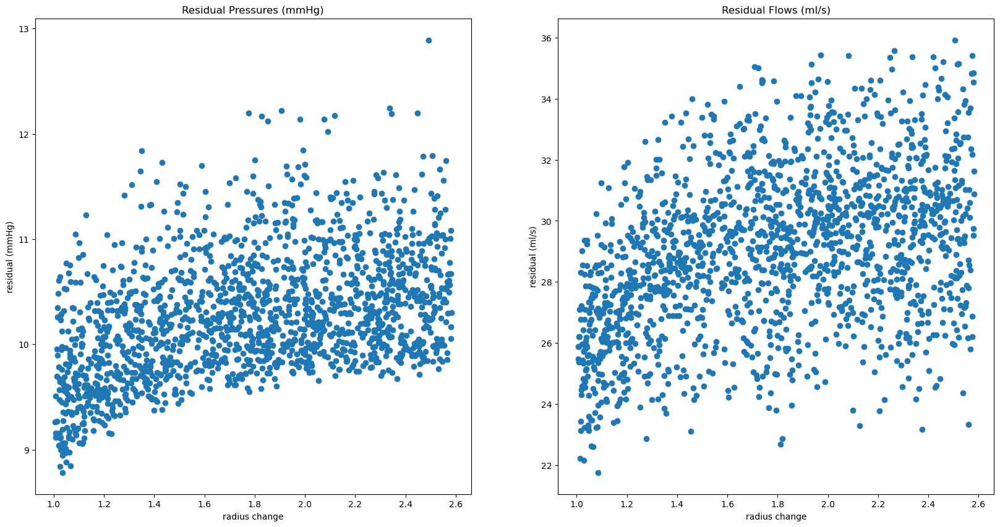

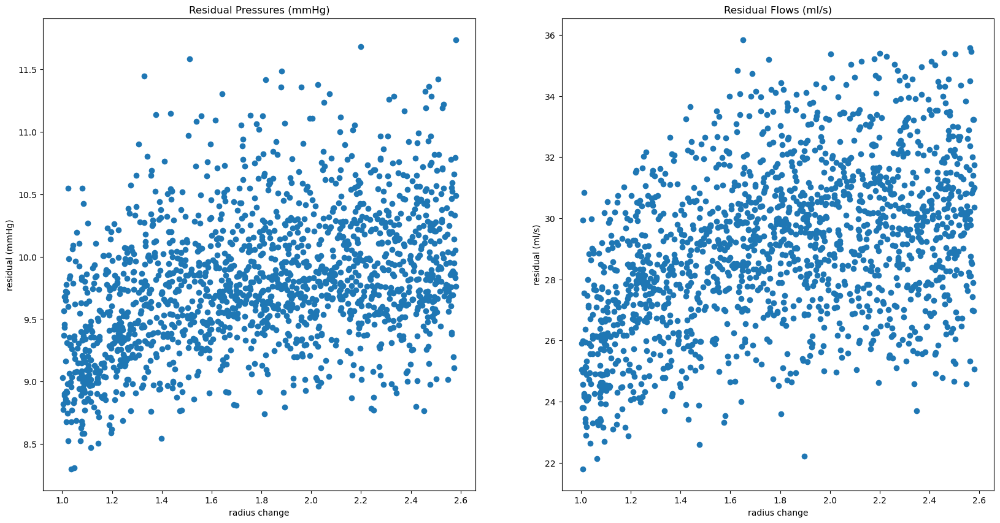

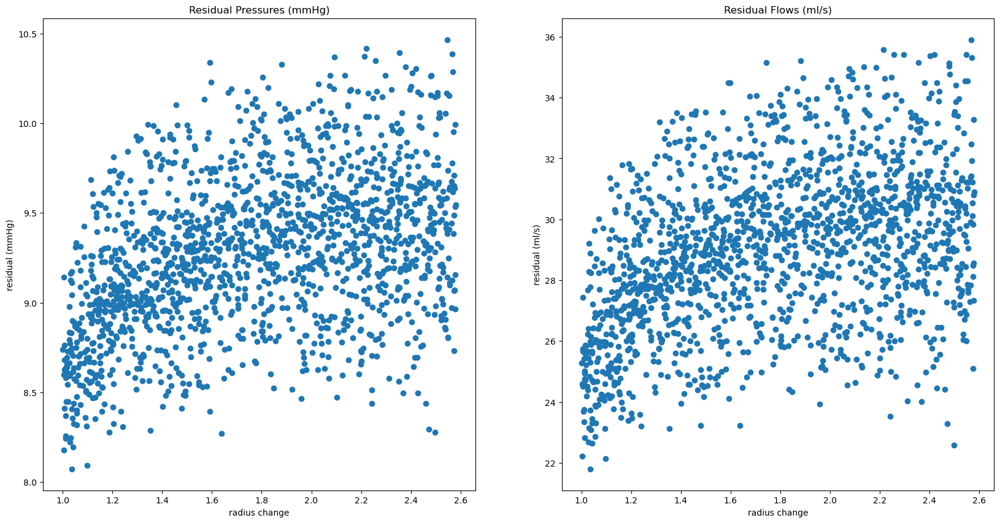

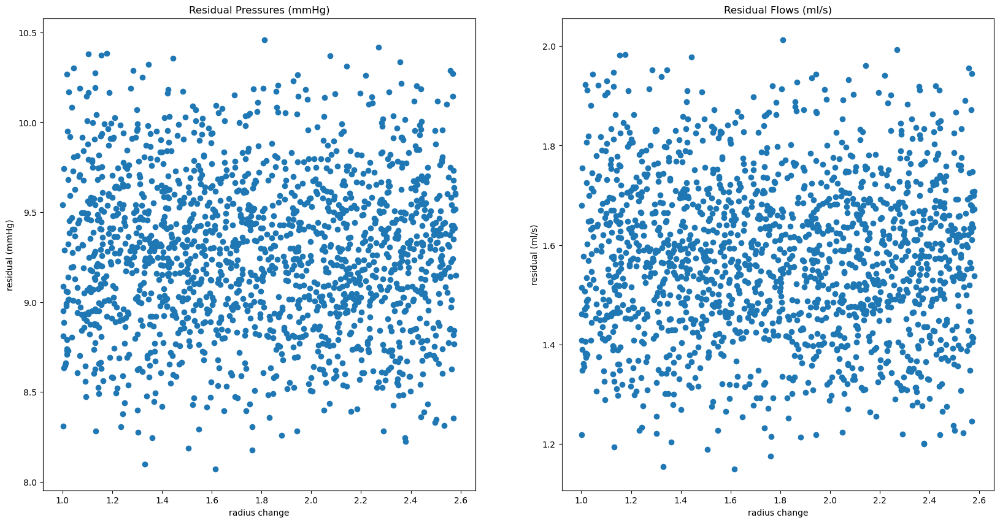

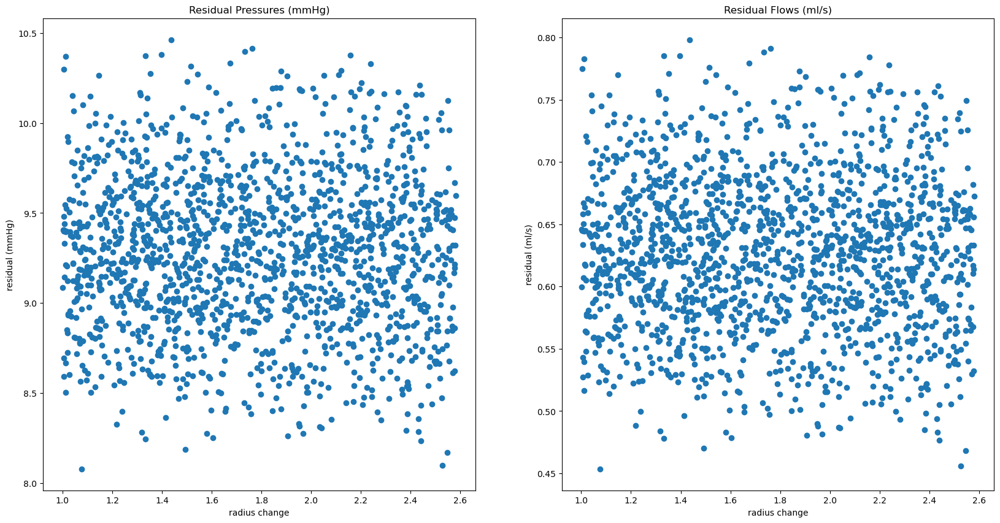

...

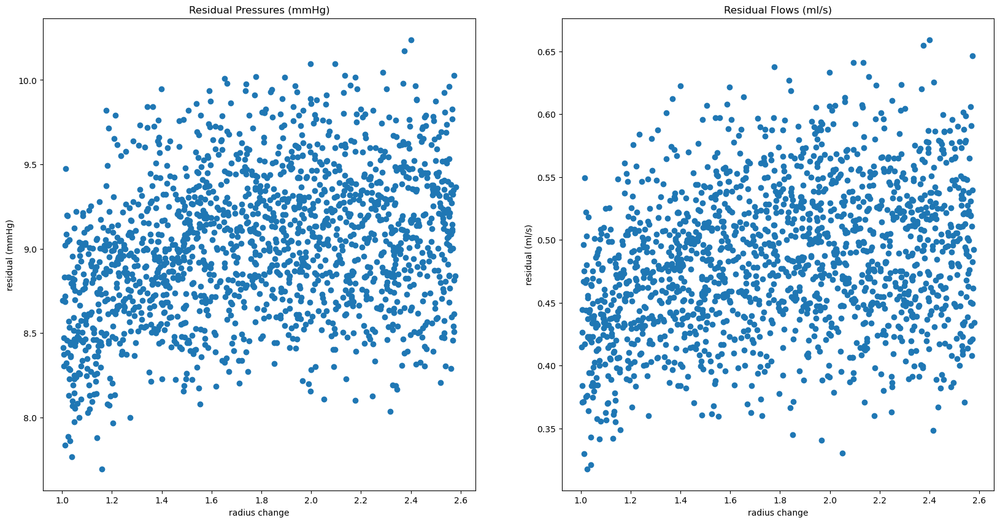

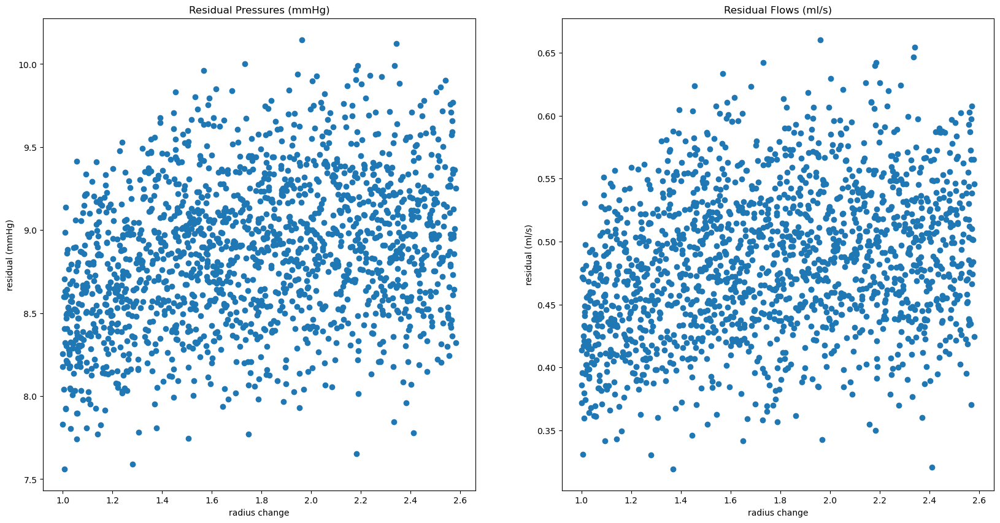

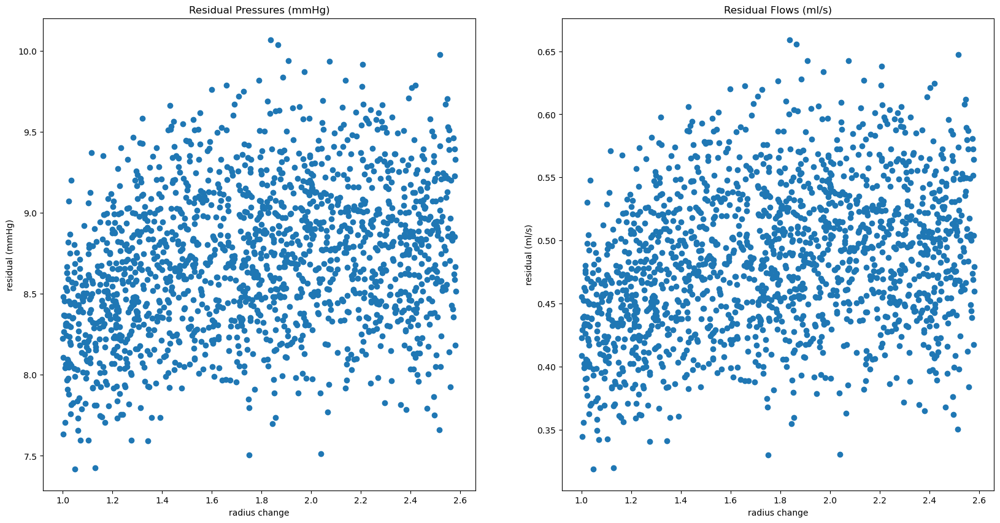

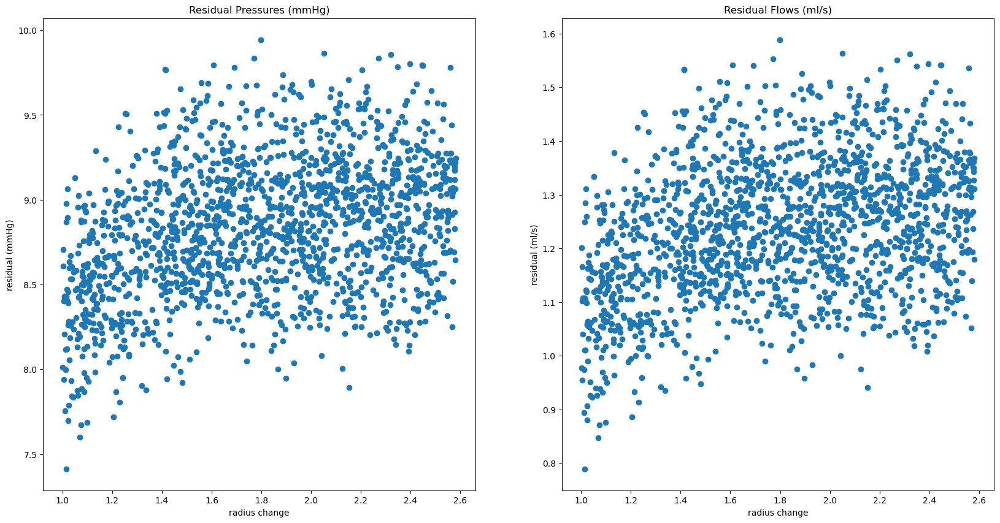

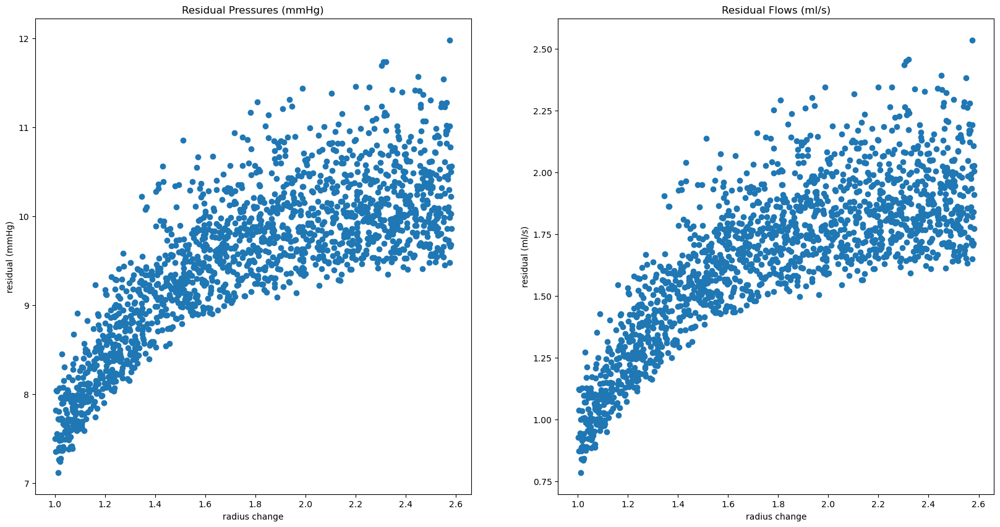

In [122]:
residual_dir = imagedir / "truths"


for i in range(len(x[0])):
    plot_residuals(x, rez[:,1], i, save = True, save_dir = residual_dir)

C:\Users\johnd\AppData\Local\Temp\ipykernel_19236\3876548191.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, 2, figsize = (20, 10))


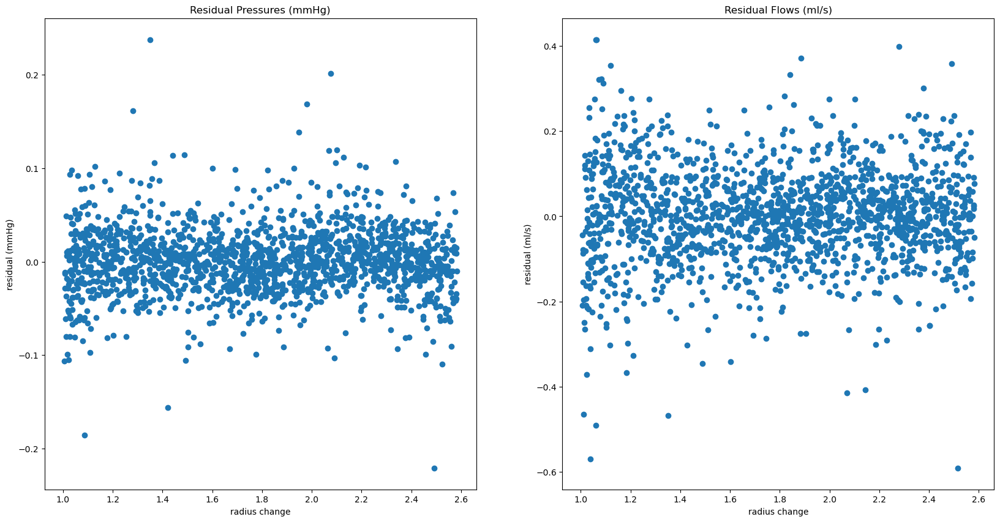

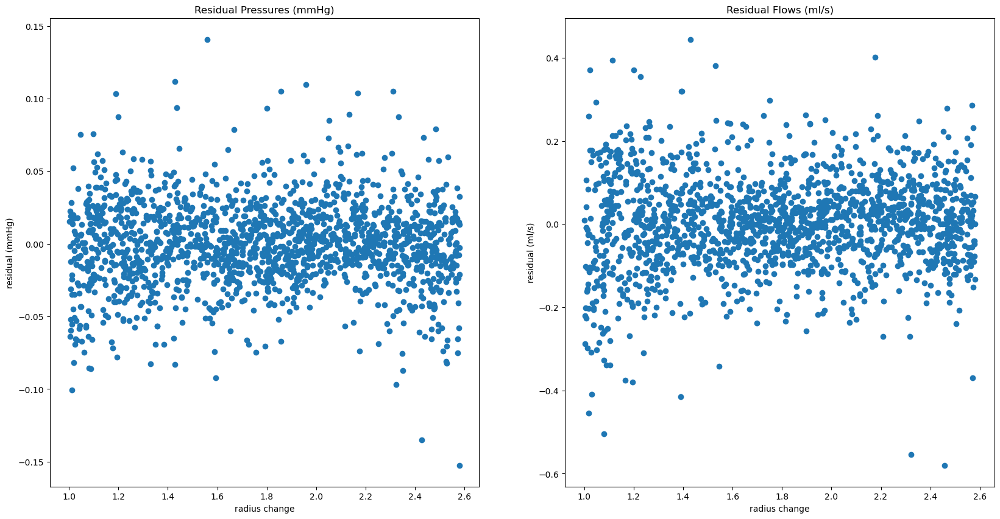

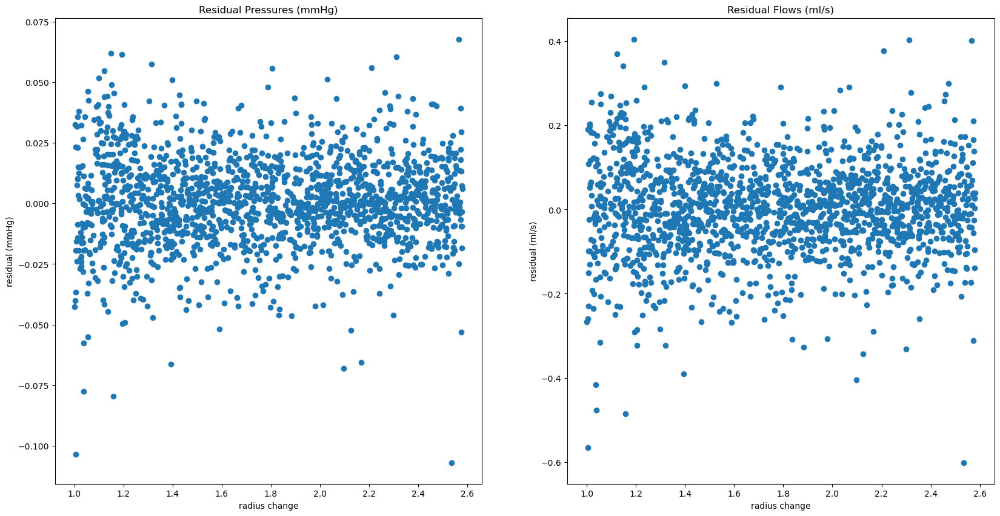

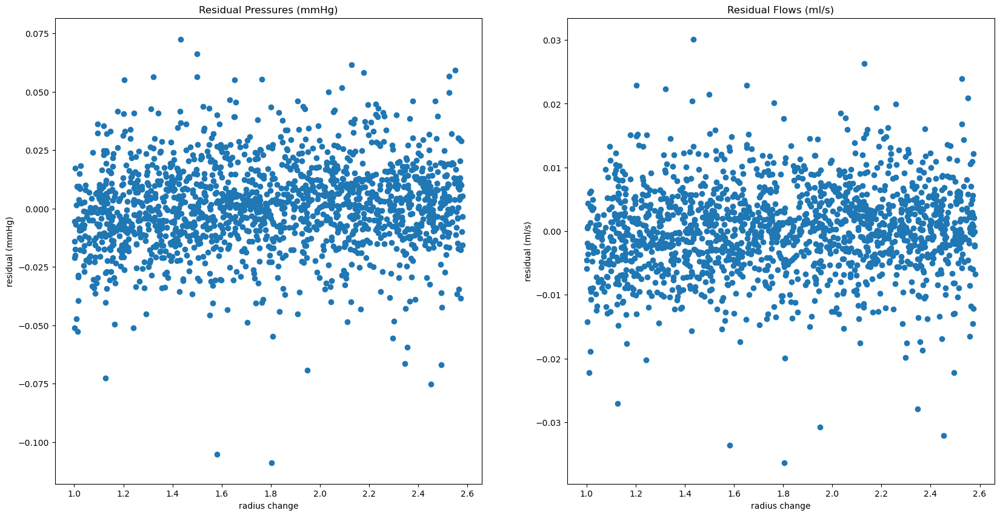

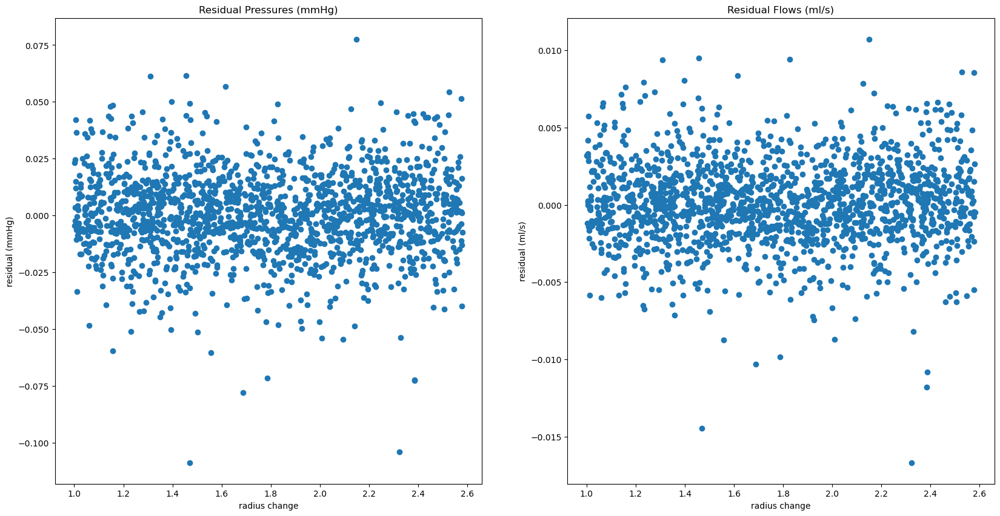

...

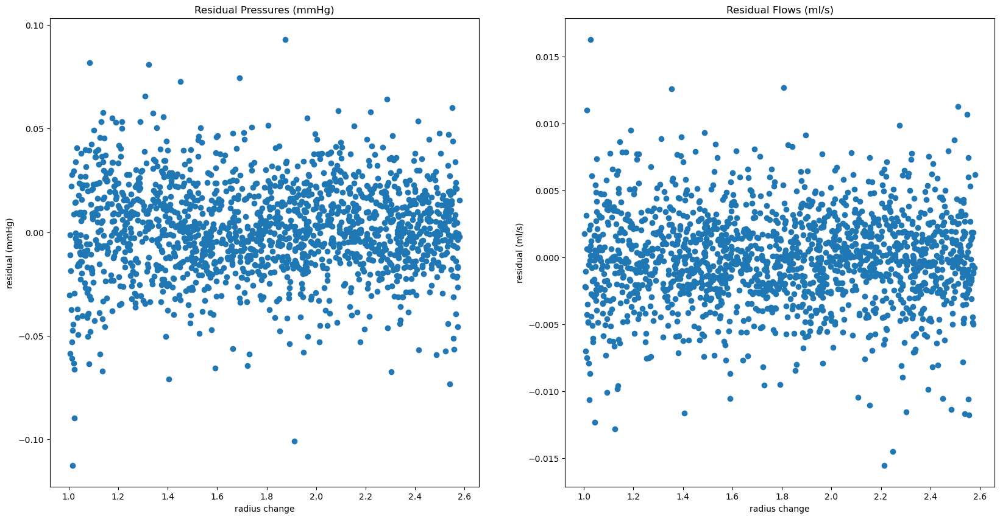

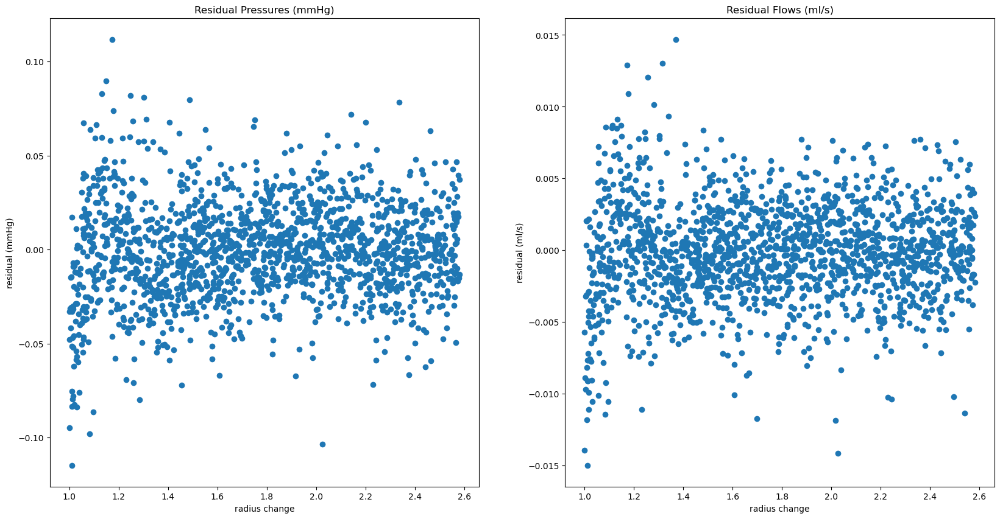

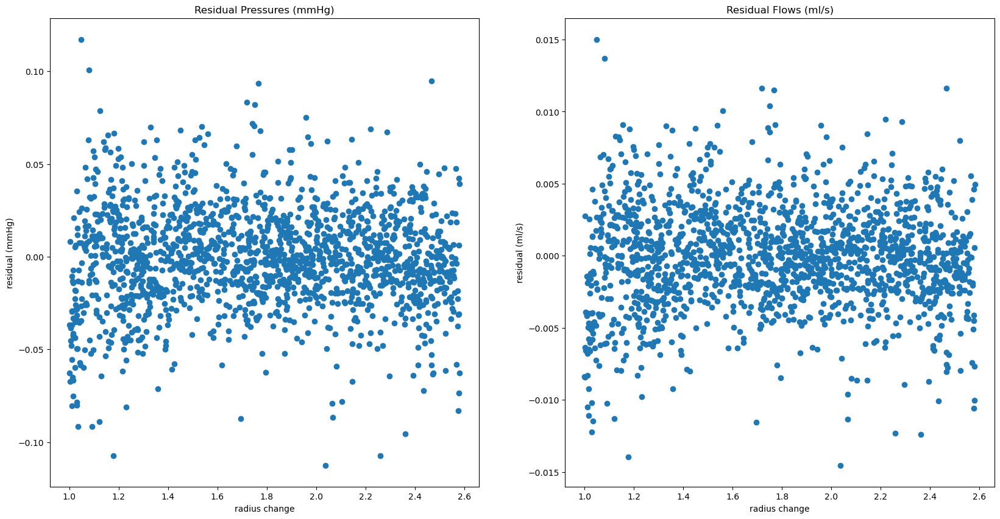

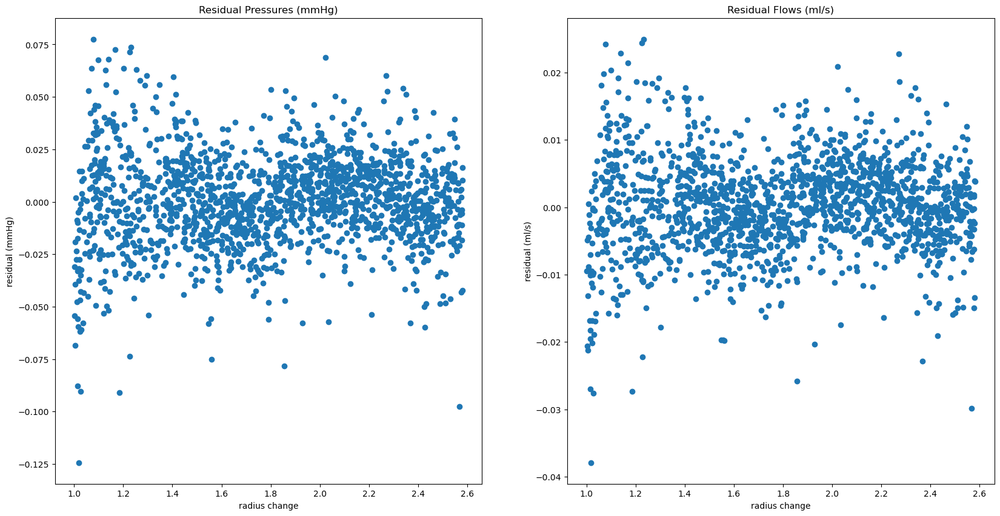

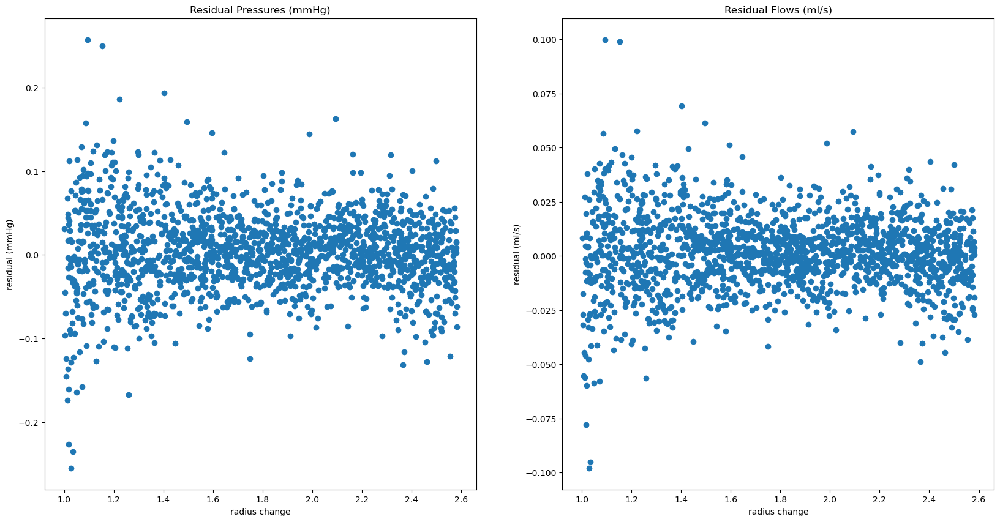

In [75]:
residual_dir = imagedir / "residuals"

for i in range(len(x[0])):
    plot_residuals(x, residuals, i, save = True, save_dir = residual_dir)

C:\Users\johnd\AppData\Local\Temp\ipykernel_19236\1560473052.py:20: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


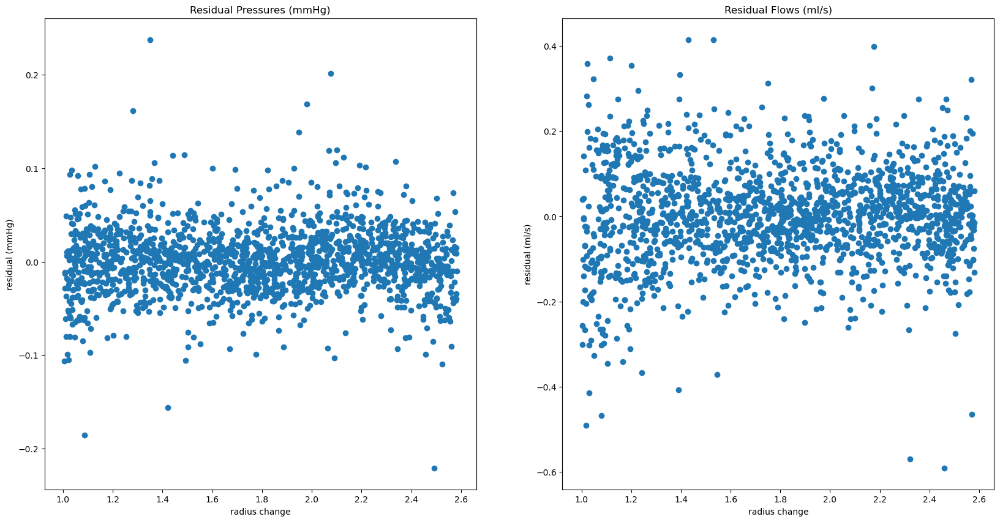

In [66]:
plot_residuals(x, residuals, 0, save = False)

In [76]:
# plot by generations
from src.solver import Solver0D

In [84]:
solver_file = Path("../data/healthy/0080_0001/jc_solver_dir_0/artificial_stenosis/Manual_0/0080_0001_model_jc_art_sten.in")
stenosis_file = Path("../data/healthy/0080_0001/jc_solver_dir_0/artificial_stenosis/Manual_0/stenosis_vessels.dat")

In [78]:
s = Solver0D()
s.read_solver_file(solver_file)

In [90]:
tree = s.get_vessel_tree()

In [91]:
from src.file_io import read_json

stenosis = read_json(stenosis_file)

In [92]:
changed_vessels = stenosis['all_changed_vessels']

In [96]:
changed_vessels

[14,
 15,
 16,
 159,
 124,
 125,
 126,
 96,
 122,
 8,
 168,
 71,
 48,
 49,
 50,
 200,
 107,
 161,
 91,
 52,
 53,
 54,
 119,
 165]

In [118]:
from collections import defaultdict
gen_map = defaultdict(list)
for node in s.tree_bfs_iterator(tree):
    if node.vess_id[0] in changed_vessels:
        gen_map[node.generation] += node.vess_id

In [119]:
gen_map

defaultdict(list,
            {1: [14, 15, 16],
             2: [122, 96, 124, 159, 125, 126],
             3: [8,
              71,
              165,
              168,
              52,
              48,
              119,
              107,
              161,
              91,
              200,
              53,
              49,
              54,
              50]})

In [120]:
changed_vessels

[14,
 15,
 16,
 159,
 124,
 125,
 126,
 96,
 122,
 8,
 168,
 71,
 48,
 49,
 50,
 200,
 107,
 161,
 91,
 52,
 53,
 54,
 119,
 165]

In [121]:
for i in gen_map:
    print("Generation", i)
    pmses = []
    qmses = []
    for vess in gen_map[i]:
        
        vindex = changed_vessels.index(vess)
        pindex = vindex *2 
        qindex = vindex *2 + 1
        p_mse = torch.nn.functional.mse_loss(rez[:, 0, pindex], rez[:, 1, pindex]).item()
        q_mse = torch.nn.functional.mse_loss(rez[:, 0, qindex], rez[:, 1, qindex]).item()
        print("\tVessel", vess, "; Pressure Loss:", p_mse, "; Flow Loss", q_mse, ";")
        pmses.append(p_mse)
        qmses.append(q_mse)
    print("-----------------------------------------------")
    print("\tTotal:",  "Pressure Loss:", np.array(pmses).mean(), "; Flow Loss", np.array(qmses).mean(), ";")
    print()
    

        

Generation 1
	Vessel 14 ; Pressure Loss: 2253.48388671875 ; Flow Loss 0.012363802641630173 ;
	Vessel 15 ; Pressure Loss: 1472.7283935546875 ; Flow Loss 0.01211506500840187 ;
	Vessel 16 ; Pressure Loss: 603.64013671875 ; Flow Loss 0.01235970202833414 ;
-----------------------------------------------
	Total: ; Pressure Loss: 1443.2841389973958 ; Flow Loss 0.01227952322612206 ;

Generation 2
	Vessel 122 ; Pressure Loss: 2474.669921875 ; Flow Loss 0.00012103370681870729 ;
	Vessel 96 ; Pressure Loss: 2550.463623046875 ; Flow Loss 0.00036805137642659247 ;
	Vessel 124 ; Pressure Loss: 599.35302734375 ; Flow Loss 7.195477792265592e-06 ;
	Vessel 159 ; Pressure Loss: 608.32421875 ; Flow Loss 4.641125269699842e-05 ;
	Vessel 125 ; Pressure Loss: 605.5057983398438 ; Flow Loss 7.114534128049854e-06 ;
	Vessel 126 ; Pressure Loss: 604.4542846679688 ; Flow Loss 7.050193744362332e-06 ;
-----------------------------------------------
	Total: ; Pressure Loss: 1240.4618123372395 ; Flow Loss 9.2809423601162

In [124]:
%load_ext tensorboard

In [126]:
%tensorboard --logdir ../data

Reusing TensorBoard on port 6006 (pid 11108), started 0:00:05 ago. (Use '!kill 11108' to kill it.)

In [127]:
import tensorboard as tb

In [131]:
help(tb.data.experimental.ExperimentFromDev("C:\Users\johnd\Documents\College\StenosisTool\StenosisTool\data\healthy\0080_0001\jc_solver_dir_0\artificial_stenosis\Manual_0\training_results\run1\lightning_logs\version_24\events.out.tfevents.1662259088.Supercomputer.16500.1"))

SyntaxError: (unicode error) 'unicodeescape' codec can't decode bytes in position 2-3: truncated \UXXXXXXXX escape (2987919965.py, line 1)

In [134]:
tb.data.experimental.experiment_from_dev(,)

SyntaxError: invalid syntax (3073910573.py, line 1)